<span style="font-size:11px">


#### >>>> NLP 전처리 일반 순서 (영어 텍스트 기준)
- 정규화 → (선택적) 노이즈 제거 → 토큰화 → 소문자화 → 불용어 제거 → 표제어/어간 처리 → 벡터화 → 모델 학습

| 단계                                            | 내용                  | 설명                                                                          | 주요 함수 / 메서드                                            |
| --------------------------------------------- | ------------------- | --------------------------------------------------------------------------- | ------------------------------------------------------ |
| **1. 정규화 (Normalization)**                    | 텍스트 일관성 확보          | Unicode 정규화, 축약형 확장(`I’m → I am`), 철자 통일 등. 텍스트 형태를 표준화.                    | `str.replace()`, `unicodedata.normalize()`             |
| **2. (선택적) 노이즈 제거 (Noise Removal)**           | URL, HTML, 이메일 등 제거 | 학습에 불필요한 정보(링크, 태그, 특수기호) 제거. 단, 구두점(`'`, `!`)은 tokenizer가 처리하도록 남김.        | `re.sub()`                                             |
| **3. 토큰화 (Tokenization)**                     | 문장을 단어 단위로 분리       | 단어·구두점을 기준으로 문장을 나눔. NLP 전처리의 시작 단계.                                        | `word_tokenize()`, `RegexpTokenizer()`                 |
| **4. 소문자화 (Lowercasing)**                     | 대소문자 통일             | NLP 모델은 대소문자를 구분하지 않으므로 모두 소문자로 변환. 고유명사 중요 시 생략.                           | `str.lower()`                                          |
| **5. 불용어 제거 (Stopwords Removal)**             | 의미 없는 단어 제거         | “a”, “the”, “is” 등 자주 등장하지만 의미 없는 단어를 제거. 부정어(`not`, `no`, `n't`)는 보존할지 결정. | `stopwords.words()`, `list comprehension`              |
| **6. 표제어 / 어간 처리 (Lemmatization / Stemming)** | 단어의 기본형 복원          | **Lemmatization**: 문법 기반 복원 (정확) <br> **Stemming**: 규칙 기반 어미 제거 (빠름)        | `WordNetLemmatizer()`, `PorterStemmer()`               |
| **7. 벡터화 (Vectorization)**                    | 단어 → 숫자 변환          | 단어를 수치로 표현해 모델 학습이 가능하도록 함.                                                 | `CountVectorizer()`, `TfidfVectorizer()`, `Word2Vec()` |
| **8. 모델 학습 / 예측 (Training / Inference)**      | 모델 훈련 및 결과 도출       | 전처리된 데이터를 사용해 감정 분석, 분류, 요약 등 수행.                                           | `fit()`, `predict()`                                   |



##### 💡 한 줄 요약
**URL/HTML 등의 노이즈는 토큰화 전에 제거하고, 구두점·약어는 토크나이저에 맡긴다.**  
그다음 `토큰화 → 소문자화 → 불용어 제거 → 표제어/어간 처리 → 벡터화 → 모델 학습` 순서로 진행하는 것이 가장 일반적이다.


<span style="font-size:11px">

------------------

##### >>>> 노이즈와 불용어 제거
- set자료구조를 사용 : 중복제거
- List Comprehension : 필터링
- NLTK 불용어 사전

------------------

##### >>>> 노이즈 제거

| 종류        | 예시                   | 제거 방법                                        |        |                   |
| --------- | -------------------- | -------------------------------------------- | ------ | ----------------- |
| 특수문자      | `!`, `?`, `#`, `~`   | 정규식 `re.sub(r"[^가-힣A-Za-z0-9\s]", "", text)` |        |                   |
| 이모티콘, 이모지 | 😊, 👍, 😂           | 정규식 또는 emoji 라이브러리                           |        |                   |
| 반복 문자     | “ㅋㅋㅋㅋ”, “ㅎㅎㅎ”, “~~~” | 정규식 `re.sub(r"(.)\1{2,}", r"\1\1", text)`    |        |                   |
| HTML 태그   | `<br>`, `<p>` 등      | `re.sub(r"<.*?>", "", text)`                 |        |                   |
| URL, 이메일  | `https://`, `@gmail` | `re.sub(r"http\S+                            | www\S+ | @\S+", "", text)` |

<span style="font-size:11px">

---------

#### >> 토큰화
##### >>>> 토큰화 목적
- NLP(자연어처리)에서 가장 첫번째이자 가장 중요한 단계

| 분야                        | 토큰화를 왜 하는가                              |
| ------------------------- | --------------------------------------- |
| **텍스트 분류** (감성분석, 스팸탐지 등) | 문장을 단어 단위로 쪼개야 각 단어의 의미를 모델이 학습할 수 있음   |
| **감정 분석**                 | “좋다”, “싫다” 같은 단어가 몇 번 나왔는지 계산 가능        |
| **챗봇, 번역기, 요약기**          | 모델이 입력 문장을 단어 또는 서브워드 단위로 처리해야 문맥 파악 가능 |
| **검색 시스템**                | 사용자의 검색어를 단어 단위로 분석해 문서와 매칭             |
| **언어모델(BERT, GPT 등)**     | 입력 텍스트를 토큰으로 변환해야 신경망이 이해할 수 있음         |



##### >>>> 문장 토큰화 sent_tokenize
- 기본 로직
    - 마침표, 느낌표, 물음표를 문장 끝 후보로 인식
    - 약어 패턴 학습 (Dr, Mr, U.S.A 등)
    - 대문자로 시작하는지
    - 통계적 모델을 사용해 진짜 문장 경계인지 판단
- 다국어 지원
- 약어와 실제 문장끝을 구분하는 기게학습 모델 내장

##### >>>> 단어 토큰화 word_tokenize
- 기본 로직
    - 규칙 기잔
    - 공백기준으로 단어분리
    - 구두점을 별도 토큰으로 분리
    - 축약형 처리 (it's --> it, s 로 구분)
    - 소유격 처리 (Let's --> let, s 로 구분)

- 구두점 기반 WordPunctTokenizer
    - It's ---> It, ' , s 로 구분

##### >>>> 정규 표현식을 이용한 토큰화 regex / regexp


##### >>>> NLTK의 주요 토큰화 도구 비교

| 이름                       | 방식                              | 예시 결과                                                     | 특징                                            | 사용 시점                      |
| ------------------------ | ------------------------ | --------------------------------- | ------------------------------------------------ | -------------------------- |
| **`word_tokenize`**      | 문법 기반 (NLTK 내장 punkt tokenizer) | `"I can't go." → ['I', 'ca', "n't", 'go', '.']`           | 가장 일반적인 영어 문장용 토크나이저<br>약어·구두점·줄임말 등 자연스럽게 처리 | **일반 영어 문장 토큰화에 가장 많이 사용** |
| **`WordPunctTokenizer`** | **단어와 구두점을 분리**                 | `"I can't go." → ['I', 'can', "'", 't', 'go', '.']`       | 구두점을 완전히 분리해서 처리<br>약어 형태를 따로 분리함             | 구두점을 분석하거나 제거할 때 용이        |
| **`RegexpTokenizer`**    | **정규식(Regex)**을 직접 지정           | 정규식: `r'\w+'` → `'I can't go.' → ['I', 'can', 't', 'go']` | 사용자가 직접 규칙 정의<br>숫자, 영어, 한글 등 맞춤형 토큰화 가능      | **한글 처리, 사용자 정의 규칙 필요할 때** |
| **정규식 토큰화 (직접 구현)**      | 직접 `re.findall()` 사용            | `re.findall(r"[A-Za-z]+", text)`                          | NLTK 안 써도 가능. 가장 유연함.                         | **특수한 규칙 기반 토큰화나 실험용**     |

<br>

| 라이브러리                               | 이름                                 | 설명 / 특징                            | 추천 사용처                    |
| ----------------------------------- | ---------------------------------- | ---------------------------------- | ------------------------- |
| **KONLPy**                          | `Okt`, `Mecab`, `Kkma`, `Hannanum` | 한국어용 형태소 분석기 (단어 + 품사 구분)          | 한글 문장 NLP (감정분석, 문장 분류 등) |
| **spaCy**                           | `nlp(text)` → `token.text`         | 영어 고성능 토큰화 + 품사 태깅 + 의존구문분석        | 영어 문장 분석 고급용              |
| **Hugging Face Transformers**       | `AutoTokenizer`                    | 딥러닝 모델 전용 서브워드 토크나이저 (BERT, GPT 등) | 인공지능 모델 입력용               |
| **SentencePiece / WordPiece / BPE** | 언어 독립형 서브워드 토큰화                    | 희귀 단어 분할해 학습 효율↑                   | 대규모 언어모델 학습 시 필수          |

<br>

| 구분                     | 구두점 처리  | 축약형 처리 | 사용자 규칙 | 한글 적합성  | 주요 용도             |
| ---------------------- | ------- | ------ | ------ | ------- | ----------------- |
| **word_tokenize**      | O       | O      | X      | △       | 영어 문장 일반용         |
| **WordPunctTokenizer** | 완전 분리   | 세분화    | X      | △       | 기호 분석, 문장부호 포함 처리 |
| **RegexpTokenizer**    | 정규식에 따라 | X      | O      | **◎**   | 한글/맞춤형 전처리        |
| **re.findall**         | 완전 자유   | X      | **최고** | **◎**   | 사용자 정의 / 특수 상황    |
| **Okt/Mecab 등**        | 형태소 기반  | O      | 한국어 전용 | **◎◎◎** | 한국어 NLP           |


---
<span style="font-size:11px">

#### >>>> 형태소 기반 토큰화
- 문장을 형태소 단위로 쪼개고, **각 형태소의 품사(명사, 동사, 조사 등)**를 함께 분석하는 것

| 분석기          | 제공 라이브러리                          | 특징                       |
| ------------ | --------------------------------- | ------------------------ |
| **Okt**      | `from konlpy.tag import Okt`      | 가장 간단하고 대중적, 카카오에서 개발    |
| **Mecab**    | `from konlpy.tag import Mecab`    | 속도 빠르고 정확도 높음 (대형 프로젝트용) |
| **Kkma**     | `from konlpy.tag import Kkma`     | 문장 단위 분석 세밀함             |
| **Hannanum** | `from konlpy.tag import Hannanum` | 구문 분석 중심                 |
| **Komoran**  | `from konlpy.tag import Komoran`  | 품사 태깅 정확도 우수             |


<span style="font-size:11px">

------------------

##### >>>> 노이즈와 불용어 제거
- set자료구조를 사용 : 중복제거
- List Comprehension : 필터링
- NLTK 불용어 사전

------------------

##### >>>> 불용어 제거 (Stopwords Removal)
- 개념: 문법적으로는 필요하지만, 의미 분석에는 거의 도움이 되지 않는 단어를 제거
- 영어: I, a, the, is, at, in
- 한국어: 이, 그, 저, 그리고, 에서, 으로

------------------

#### >>>> 어근 추출 (Stmming)
- 개념 : 단어의 어미를 잘라서 같은 의미의 단어를 동일하게 처리
- running, runs, ran → run
- 즉, 형태는 달라도 “뿌리 단어(root)”가 같으면 하나로 통일.


#### >>>> 표제어 추출(Lemmatization)
- 개념 : 단어의 문법적 형태를 분석해, **사전에 있는 원형(표제어)**으로 바꾸는 것
- running → run / was → be / better → good

<br>

| 구분    | Stemming                   | Lemmatization        |
| ----- | -------------------------- | -------------------- |
| 처리 방식 | 단순 규칙으로 자름                 | 품사와 문법 분석            |
| 결과 단어 | 실제 단어 아닐 수 있음 (예: “studi”) | 실제 사전 단어             |
| 정확도   | 빠르지만 부정확                   | 느리지만 정확              |
| 대표 도구 | Porter, Lancaster          | WordNetLemmatizer    |
| 사용 시점 | 빠른 전처리, 단순 모델              | 고품질 NLP (BERT, 번역 등) |


In [1]:
# %conda install nltk

In [2]:
from nltk.tokenize import sent_tokenize
import nltk
# nltk.download('punkt')
# nltk.download('punkt_tab')
# nltk.download('wordnet')
# nltk.download('webtext')
# nltk.download('stopwords')

In [3]:
sentence = "hello everyone. It's good to see you. Let's strart our text mining class"
sent_tokenize(sentence) # --> List로 출력됨

['hello everyone.',
 "It's good to see you.",
 "Let's strart our text mining class"]

In [4]:
sentence_kor = "안녕하세요, 여러분. 만나서 반갑습니다. 이제 학습을 시작해 볼까요?"
sent_tokenize(sentence_kor)

['안녕하세요, 여러분.', '만나서 반갑습니다.', '이제 학습을 시작해 볼까요?']

In [5]:
from nltk.tokenize import word_tokenize
word_tokenize(sentence_kor) 

['안녕하세요', ',', '여러분', '.', '만나서', '반갑습니다', '.', '이제', '학습을', '시작해', '볼까요', '?']

In [6]:
# word_tokenize는 It' / s 로 분리되지만 하기 WordPunctTOkenize는 It / ' / s 로 분리
from nltk.tokenize import word_tokenize
word_tokenize(sentence) 

['hello',
 'everyone',
 '.',
 'It',
 "'s",
 'good',
 'to',
 'see',
 'you',
 '.',
 'Let',
 "'s",
 'strart',
 'our',
 'text',
 'mining',
 'class']

In [7]:
# 상기 word_tokenize는 It' / s 로 분리되지만 이건 It / ' / s 로 분리
from nltk.tokenize import WordPunctTokenizer
WordPunctTokenizer().tokenize(sentence)  #WorkPunctTokenizer 클래스라서 이렇게 작성해야함

['hello',
 'everyone',
 '.',
 'It',
 "'",
 's',
 'good',
 'to',
 'see',
 'you',
 '.',
 'Let',
 "'",
 's',
 'strart',
 'our',
 'text',
 'mining',
 'class']

In [ ]:
# 정규식 토큰화
import re
re.findall ('[abc]', 'how are you, boy') # 뒤에 문장에서 [abc] 중에 들어간것을 출력

import re
text = "I bought 3 apples at 5,000원!"
tokens = re.findall(r"[A-Za-z가-힣0-9]+", text)
print(tokens)

# r"[A-Za-z가-힣0-9]+"
# “영어 대문자(A–Z), 영어 소문자(a–z), 한글(가–힣), 숫자(0–9)가 1개 이상 연속된 문자열”을 찾아라.

['I', 'bought', '3', 'apples', 'at', '5', '000원']


In [9]:
# 노이즈와 불용어 제거
from nltk.corpus import stopwords
english_stops = stopwords.words('english')
test1 = "sorry, I couldn't go to movie yesterday with you"
tokens = word_tokenize(test1)

[token for token in tokens if token not in english_stops]


['sorry', ',', 'I', 'could', "n't", 'go', 'movie', 'yesterday']

In [10]:

# 노이즈와 불용어 제거
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
english_stops = stopwords.words('english')
test1 = "sorry, i couldn't go to movie yesterday with you"
# tokens = word_tokenize(test1)
tokenizer = RegexpTokenizer("[\\w']+")
tokens = tokenizer.tokenize(test1.lower())

[token for token in tokens if token not in english_stops]


['sorry', 'go', 'movie', 'yesterday']

In [11]:
# 소문자 a~z  단어중에서 4글자이상
RegexpTokenizer("[a-z]{4,}")

# 3글자 이상
RegexpTokenizer("[\\w']{3,}")

# 어포스트로피를 패턴에서 제외 cat't ---> can, t 로 분류
RegexpTokenizer("[\\w]")

RegexpTokenizer(pattern='[\\w]', gaps=False, discard_empty=True, flags=re.UNICODE|re.MULTILINE|re.DOTALL)

In [12]:
# 어간추출 (stemming)
# 줄기 stem 단어에서 불필요한 요소를 제거하고 남은 핵심형태
# 단어는 다양한 형태 .. 복수형 과거형과 같은 시제변환, 복수형 
# 단어를 통일
    # walks walking walked --> 어간 walk
    # 먹는다 먹었다 --> 어간 '먹-'으로 묶어서 컴퓨터가 같은 단어로 인식

from nltk.stem import PorterStemmer
stemmer = PorterStemmer()
stemmer.stem('cooking'), stemmer.stem('cookery'), stemmer.stem('cookboos'), stemmer.stem('먹는다'), stemmer.stem('먹었다')

('cook', 'cookeri', 'cookboo', '먹는다', '먹었다')

In [13]:
# PorterStemmer 
    # 규칙기반이라서 완벽하지 못함 --> 의미가 달라질수도 있음
    # but, 속도가 빠름

In [14]:
from nltk.stem import LancasterStemmer
stemmer = LancasterStemmer()
stemmer.stem('cooking'), stemmer.stem('cookery'), stemmer.stem('cookboos'), stemmer.stem('먹는다'), stemmer.stem('먹었다')

('cook', 'cookery', 'cookboo', '먹는다', '먹었다')

In [15]:
# 표제어 추출 Lemmatization
# Lemma 단어의 사전 기본형
# 단어의 변형(시제, 복수, 비교급)을 제거하고 사전 (headword)에 나오는 정확한 원형으로 바꾸는 과정
# 어간처럼 단어줄기가 아니라, 맥락과 품사를 고려한 올바른 형태
# better(더 좋은) --> 표제어 good(좋은)
# 먹었다 --> 먹다 (동사원형)

# 한국어
# 알고리즘: 형태소 분석기 (konlpy)를 사용해 품사(명사,동사)를 보고 정확히 변환
# 주요 목적
    # 장점: 어간 추출처럼 대충 출이지 않고 맥락에 맞는 정확한 단어로 만들어서 NLP 품질 향상
    # 단점 : 사전에 의존해서 언어/맥락 제한

In [16]:
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
print(lemmatizer.lemmatize('cooking'))  #기본이 명사로 인식
print(lemmatizer.lemmatize('cooking', pos='v')) #품사를 동사로 인식해서 출력
print(lemmatizer.lemmatize('먹는'))  
print(lemmatizer.lemmatize('먹고있는', pos='v')) 
# n noun (명사) ---> 기본
# v verb (동사)
# a adjective (형용사)
# r averb (부사)
print(lemmatizer.lemmatize('better'))  
print(lemmatizer.lemmatize('better', pos='a')) 

cooking
cook
먹는
먹고있는
better
good


In [17]:
# 품사 태깅
import nltk
from nltk.tokenize import word_tokenize
# nltk.download('averaged_perceptron_tagger_eng')

token = "hello everyone. It's good to see ypu. Let's start out text mining class!"
tokens = word_tokenize(token)
nltk.pos_tag(tokens) #단어의 품사를 출력

# 품사 태그 정보 확인
# nltk.download('tagsets_json')
nltk.help.upenn_tagset('VB') # 명사 동사 형용사 NN VB JJ


VB: verb, base form
    ask assemble assess assign assume atone attention avoid bake balkanize
    bank begin behold believe bend benefit bevel beware bless boil bomb
    boost brace break bring broil brush build ...


In [18]:
# 특정 품사 (명사, 동사, 형용사) 추출
tag_lists = ['NN', 'VB', 'JJ']
[word for word, tag in nltk.pos_tag(tokens) if tag in tag_lists]

['hello', 'everyone', 'good', 'see', 'Let', 'start', 'text', 'mining', 'class']

In [19]:
# NLTK는 영어기반 한국어의 조사분리 불가능, 어미변화처리 불가능
# 한국어는 KoNlpy Okt 로 사용

<span style="font-size:11px">

- step1 자바 다운로드 받기
https://jdk.java.net/25/
다운 받고 파일 압축풀고
c:/program files 에 폴더 넣어주기

- 그런 다음 하기 실행하고

setx JAVA_HOME "C:\Users\playdata2\Downloads\openjdk-25.0.1_windows-x64_bin\jdk-25.0.1"
setx PATH "%PATH%;%JAVA_HOME%\bin"

- vs 코드 재부팅

%pip install JPypel
%pip install konlpy

컴퓨터 재부팅

In [20]:
# %pip install JPypel
# %pip install konlpy

In [21]:
sentence = '''절망의 반대가 희망은 아니다.
어두운 밤하늘에 별이 빛나듯
희망은 절망 속에 싹트는 거지
만약에 우리가 희망함이 적다면
그 누가 세상을 비출어줄까.
정희성, 희망 공부'''
 
tokens  = word_tokenize(sentence)
print (tokens)
print (nltk.pos_tag(tokens))

['절망의', '반대가', '희망은', '아니다', '.', '어두운', '밤하늘에', '별이', '빛나듯', '희망은', '절망', '속에', '싹트는', '거지', '만약에', '우리가', '희망함이', '적다면', '그', '누가', '세상을', '비출어줄까', '.', '정희성', ',', '희망', '공부']
[('절망의', 'JJ'), ('반대가', 'NNP'), ('희망은', 'NNP'), ('아니다', 'NNP'), ('.', '.'), ('어두운', 'VB'), ('밤하늘에', 'JJ'), ('별이', 'NNP'), ('빛나듯', 'NNP'), ('희망은', 'NNP'), ('절망', 'NNP'), ('속에', 'NNP'), ('싹트는', 'NNP'), ('거지', 'NNP'), ('만약에', 'NNP'), ('우리가', 'NNP'), ('희망함이', 'NNP'), ('적다면', 'NNP'), ('그', 'NNP'), ('누가', 'NNP'), ('세상을', 'NNP'), ('비출어줄까', 'NNP'), ('.', '.'), ('정희성', 'NN'), (',', ','), ('희망', 'NNP'), ('공부', 'NNP')]


In [22]:
# NMP 고유명사 : 한글의 경우, 대부분 고유명사로 잘못 인식
# 한글 konlpy 사용

from konlpy.tag import Okt
t = Okt()
print (f'형태소 : {t.morphs(sentence)}')
print (f'명사: {t.nouns(sentence)}')
print (f'품사태깅: {t.pos(sentence)}')

형태소 : ['절망', '의', '반대', '가', '희망', '은', '아니다', '.', '\n', '어', '두운', '밤하늘', '에', '별', '이', '빛나듯', '\n', '희망', '은', '절망', '속', '에', '싹트는', '거지', '\n', '만약', '에', '우리', '가', '희망', '함', '이', '적다면', '\n', '그', '누가', '세상', '을', '비출어줄까', '.', '\n', '정희성', ',', '희망', '공부']
명사: ['절망', '반대', '희망', '어', '두운', '밤하늘', '별', '희망', '절망', '속', '거지', '만약', '우리', '희망', '함', '그', '누가', '세상', '정희성', '희망', '공부']
품사태깅: [('절망', 'Noun'), ('의', 'Josa'), ('반대', 'Noun'), ('가', 'Josa'), ('희망', 'Noun'), ('은', 'Josa'), ('아니다', 'Adjective'), ('.', 'Punctuation'), ('\n', 'Foreign'), ('어', 'Noun'), ('두운', 'Noun'), ('밤하늘', 'Noun'), ('에', 'Josa'), ('별', 'Noun'), ('이', 'Josa'), ('빛나듯', 'Verb'), ('\n', 'Foreign'), ('희망', 'Noun'), ('은', 'Josa'), ('절망', 'Noun'), ('속', 'Noun'), ('에', 'Josa'), ('싹트는', 'Verb'), ('거지', 'Noun'), ('\n', 'Foreign'), ('만약', 'Noun'), ('에', 'Josa'), ('우리', 'Noun'), ('가', 'Josa'), ('희망', 'Noun'), ('함', 'Noun'), ('이', 'Josa'), ('적다면', 'Verb'), ('\n', 'Foreign'), ('그', 'Noun'), ('누가', 'Noun'), ('세상', 'N

In [23]:
# 그래프와 워드클라우드

## 1. 데이터 로드
import nltk
nltk.download('gutenberg')
from nltk.corpus import gutenberg   #구텐버그 말뭉치중에서 이상한 나라의 엘리스 텍스트를 로드
gutenberg.fileids()
doc_alice = gutenberg.open('carroll-alice.txt').read()
print(doc_alice)

[Alice's Adventures in Wonderland by Lewis Carroll 1865]

CHAPTER I. Down the Rabbit-Hole

Alice was beginning to get very tired of sitting by her sister on the
bank, and of having nothing to do: once or twice she had peeped into the
book her sister was reading, but it had no pictures or conversations in
it, 'and what is the use of a book,' thought Alice 'without pictures or
conversation?'

So she was considering in her own mind (as well as she could, for the
hot day made her feel very sleepy and stupid), whether the pleasure
of making a daisy-chain would be worth the trouble of getting up and
picking the daisies, when suddenly a White Rabbit with pink eyes ran
close by her.

There was nothing so VERY remarkable in that; nor did Alice think it so
VERY much out of the way to hear the Rabbit say to itself, 'Oh dear!
Oh dear! I shall be late!' (when she thought it over afterwards, it
occurred to her that she ought to have wondered at this, but at the time
it all seemed quite natural); but

[nltk_data] Downloading package gutenberg to
[nltk_data]     C:\Users\playdata2\AppData\Roaming\nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!


In [24]:
##  2. 토큰화 및 전처리
from nltk.tokenize import word_tokenize  #노이즈 많음
tokens_alice = word_tokenize(doc_alice)  
print(f'word_tokenize 갯수 : {len(tokens_alice):,}')

from nltk.tokenize import RegexpTokenizer   
tokenizer = RegexpTokenizer("[\\w]{3,}")    #3글자 이상
reg_alice = tokenizer.tokenize(doc_alice.lower())
print (f'RegexpTokenizer 갯수 : {len(reg_alice):,}')

word_tokenize 갯수 : 33,535
RegexpTokenizer 갯수 : 21,221


In [25]:
## 3. 불용어를 제거
from nltk.corpus import stopwords
english_stops = set(stopwords.words('english'))
result_alice = [word for word in reg_alice if word not in english_stops]
print ( f'불용어 제거 : {len(result_alice):,}')

불용어 제거 : 12,105


In [26]:
## 4. 품사 태깅 및 필터링 (명사 동사 형용사만 추출)
my_tag_set = ['NN', 'VB', 'VBD','JJ']
my_word = [word for word, tag in nltk.pos_tag(reg_alice) if tag in my_tag_set]
print (f'품사 필터링: {len(my_word):,}')

품사 필터링: 8,772


In [27]:
# %conda install wordcloud

3 channel Terms of Service accepted
Channels:
 - defaults
Platform: win-64
Solving environment: done

# All requested packages already installed.


Note: you may need to restart the kernel to use updated packages.


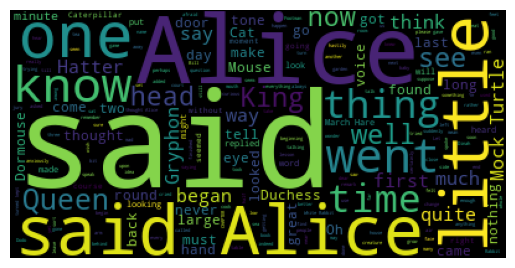

In [31]:
from collections import Counter
sorted_word_count = dict(Counter(my_word))  #딕셔너리로 변경 / 데이터 타입은 카운터
# sorted_word_count

from wordcloud import WordCloud
import matplotlib.pyplot as plt
wordcloud = WordCloud().generate(doc_alice)
plt.axis ('off')
plt.imshow(wordcloud)

# generate() → “문자열 전체를 넣으면 알아서 만들어줘”
# 역할
# WordCloud가 내부적으로 문자열을 토큰화(단어 단위로 나눔)하고,
# 각 단어의 빈도수를 자동 계산해서 워드클라우드를 생성합니다.
# 즉, 원문 텍스트 전체를 넣는 방식이에요.

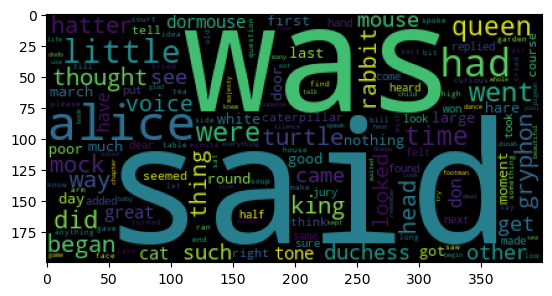

In [29]:
wc = wordcloud.generate_from_frequencies(sorted_word_count)
plt.imshow(wc)

# generate_from_frequencies() → “내가 세어놓은 단어 빈도로 직접 만들어줘”
# 역할:
# 이미 계산된 단어별 빈도 데이터를 직접 사용해서 워드클라우드를 만듭니다.
# 즉, 내가 전처리나 카운트 과정을 제어한 후 시각화할 때 사용하는 방식이에요.

카운트기반 문서표현 방법 BOW (Bag of Words), TF-IDF

In [32]:
import nltk
nltk.download("movie_reviews")

[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\playdata2\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\movie_reviews.zip.


True

In [33]:
# 데이터셋 구조 확인
from nltk.corpus import movie_reviews
print (f'review count: {len(movie_reviews.fileids())}')
print (f'리뷰 카테고리 : {movie_reviews.categories()}')

review count: 2000
리뷰 카테고리 : ['neg', 'pos']


In [35]:
# BOW 카운트 벡터 생성
# 수동 구현
documents = [movie_reviews.words(fileid) for fileid in movie_reviews.fileids()]
documents

[['plot', ':', 'two', 'teen', 'couples', 'go', 'to', ...],
 ['the', 'happy', 'bastard', "'", 's', 'quick', 'movie', ...],
 ['it', 'is', 'movies', 'like', 'these', 'that', 'make', ...],
 ['"', 'quest', 'for', 'camelot', '"', 'is', 'warner', ...],
 ['synopsis', ':', 'a', 'mentally', 'unstable', 'man', ...],
 ['capsule', ':', 'in', '2176', 'on', 'the', 'planet', ...],
 ['so', 'ask', 'yourself', 'what', '"', '8mm', '"', '(', ...],
 ['that', "'", 's', 'exactly', 'how', 'long', 'the', ...],
 ['call', 'it', 'a', 'road', 'trip', 'for', 'the', ...],
 ['plot', ':', 'a', 'young', 'french', 'boy', 'sees', ...],
 ['best', 'remembered', 'for', 'his', 'understated', ...],
 ['janeane', 'garofalo', 'in', 'a', 'romantic', ...],
 ['and', 'now', 'the', 'high', '-', 'flying', 'hong', ...],
 ['a', 'movie', 'like', 'mortal', 'kombat', ':', ...],
 ['she', 'was', 'the', 'femme', 'in', '"', 'la', ...],
 ['john', 'carpenter', 'makes', 'b', '-', 'movies', '.', ...],
 ['i', "'", 'm', 'really', 'starting', 'to', 'w

In [40]:
# 단어 빈도 계산
word_count = {}
for text in documents:
    for word in text:
        word_count[word] = word_count.get(word, 0) + 1 # --> 
        # "단어가 처음 나오면 1로 시작, 이미 있으면 기존 값에 1을 더하는" 카운팅 로직
        # "word라는 단어가 이미 word_count 딕셔너리에 있으면 기존 값에 1을 더하고,
        # 없으면 0에서 시작해서 1로 설정하라."
            # 첫 번째 단어 "apple"
            # word_count.get('apple', 0) → 'apple'이 없으므로 0 반환
            # word_count['apple'] = 0 + 1 → {'apple': 1}
        # dict.get(key, default)
            # 딕셔너리에 key가 있으면 그 값을 반환
            # 없으면 default값을 반환 (여기선 0)
            
# word_count[word] == word_count라는 딕셔너리에서 word라는 키(key)에 해당하는 값을 불러오거나 설정하는 것이에요.

# sorted_features = sorted(word_count.items(), key=lambda x: x[1], reverse=True)
# 단어 빈도 딕셔너리 (word_count)에서 가장 많이 등장한 단어를 순서대로 정렬
    # word_count === {단어: 빈도수} 형태의 딕셔너리
    # key=word_count.get === 각 단어의 빈도수값(word_count[word])을 기준으로 정렬
sorted_features = sorted(word_count, key=word_count.get, reverse=True)
sorted_features[:10]

[',', 'the', '.', 'a', 'and', 'of', 'to', "'", 'is', 'in']

In [ ]:
# 전처리 및 재계산 : 불용어 제거 + 토큰화까지 진행하는 전처리 코드
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
tokenizer = RegexpTokenizer("[\\w]{3,}")
english_stops = set(stopwords.words('english'))
documents = [movie_reviews.raw (fileid) for fileid in movie_reviews.fileids()]
# tokens = [for token in tokenizer.tokenize()]

tokens = [ [token for token in tokenizer.tokenize(doc) if token not in english_stops] for doc in documents]
len(tokens)
tokens

[['plot',
  'two',
  'teen',
  'couples',
  'church',
  'party',
  'drink',
  'drive',
  'get',
  'accident',
  'one',
  'guys',
  'dies',
  'girlfriend',
  'continues',
  'see',
  'life',
  'nightmares',
  'deal',
  'watch',
  'movie',
  'sorta',
  'find',
  'critique',
  'mind',
  'fuck',
  'movie',
  'teen',
  'generation',
  'touches',
  'cool',
  'idea',
  'presents',
  'bad',
  'package',
  'makes',
  'review',
  'even',
  'harder',
  'one',
  'write',
  'since',
  'generally',
  'applaud',
  'films',
  'attempt',
  'break',
  'mold',
  'mess',
  'head',
  'lost',
  'highway',
  'memento',
  'good',
  'bad',
  'ways',
  'making',
  'types',
  'films',
  'folks',
  'snag',
  'one',
  'correctly',
  'seem',
  'taken',
  'pretty',
  'neat',
  'concept',
  'executed',
  'terribly',
  'problems',
  'movie',
  'well',
  'main',
  'problem',
  'simply',
  'jumbled',
  'starts',
  'normal',
  'downshifts',
  'fantasy',
  'world',
  'audience',
  'member',
  'idea',
  'going',
  'dreams',

In [49]:
word_count = {}
for text in tokens:
    for word in text:
        word_count[word] = word_count.get(word,0) +1

sorted_features2 = sorted(word_count, key =word_count.get, reverse=True)
sorted_features2 

for word in sorted_features2[:10]:
    print (f'{word} : {word_count[word]}')

film : 9517
one : 5852
movie : 5771
like : 3690
even : 2565
good : 2411
time : 2411
story : 2169
would : 2109
much : 2049


In [53]:
# CountVectorizer 문서를 벡터화
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(vocabulary=sorted_features2)
cv

,input,'content'
,encoding,'utf-8'
,decode_error,'strict'
,strip_accents,None
,lowercase,True
,preprocessor,None
,tokenizer,None
,stop_words,None
,token_pattern,'(?u)\\b\\w\\w+\\b'
,ngram_range,"(1, ...)"
,analyzer,'word'


In [55]:
reviews = [movie_reviews.raw(fileid) for fileid in movie_reviews.fileids()]  #원본
reviews

['plot : two teen couples go to a church party , drink and then drive . \nthey get into an accident . \none of the guys dies , but his girlfriend continues to see him in her life , and has nightmares . \nwhat\'s the deal ? \nwatch the movie and " sorta " find out . . . \ncritique : a mind-fuck movie for the teen generation that touches on a very cool idea , but presents it in a very bad package . \nwhich is what makes this review an even harder one to write , since i generally applaud films which attempt to break the mold , mess with your head and such ( lost highway & memento ) , but there are good and bad ways of making all types of films , and these folks just didn\'t snag this one correctly . \nthey seem to have taken this pretty neat concept , but executed it terribly . \nso what are the problems with the movie ? \nwell , its main problem is that it\'s simply too jumbled . \nit starts off " normal " but then downshifts into this " fantasy " world in which you , as an audience memb

- 이 코드는 NLTK에서 제공하는 영화 리뷰 데이터셋(movie_reviews)을 불러와서
- 👉 데이터 구조를 탐색하고,
- 👉 문장 단위 / 단어 단위 토큰화를 확인하는 기본 실습 코드입니다.

In [ ]:
# 1단계: 필요한 데이터 다운로드
import nltk
# nltk.download('movie_reviews')
# nltk.download('punkt') #불용어 

# 2단계: 데이터 탐색
from nltk.corpus import movie_reviews

# 데이터셋 크기 파악
print(f"전체 영화 리뷰 수: {len(movie_reviews.fileids())}")
print(f"카테고리: {movie_reviews.categories()}")  # ['neg', 'pos']
print(f"부정 리뷰: {len(movie_reviews.fileids(categories='neg'))}개")
print(f"긍정 리뷰: {len(movie_reviews.fileids(categories='pos'))}개")

# 3단계: 첫 번째 리뷰 살펴보기
# movie_reviews.fileids()
# → 데이터셋 안의 파일 이름 목록 (문서 ID 리스트) (각 리뷰가 하나의 텍스트 파일로 저장됨)

first_review_id = movie_reviews.fileids()[0]
first_review = movie_reviews.raw(first_review_id) #→ 특정 리뷰 파일을 “원문 문자열 그대로” 불러옴
print(f"\n첫 번째 리뷰 ID: {first_review_id}")
print(f"원문 일부:\n{first_review[:200]}")

# 4단계: 토큰화 결과 확인
sentences = movie_reviews.sents(first_review_id)  # 문장 단위 토큰화
words = movie_reviews.words(first_review_id)      # 단어 단위 토큰화

print(f"\n문장 토큰화 (첫 2개):")
for i, sent in enumerate(sentences[:2]):
    print(f"  {i+1}: {sent}")

print(f"\n단어 토큰화 (첫 20개): {words[:20]}")

전체 영화 리뷰 수: 2000
카테고리: ['neg', 'pos']
부정 리뷰: 1000개
긍정 리뷰: 1000개

첫 번째 리뷰 ID: neg/cv000_29416.txt
원문 일부:
plot : two teen couples go to a church party , drink and then drive . 
they get into an accident . 
one of the guys dies , but his girlfriend continues to see him in her life , and has nightmares . 
w

문장 토큰화 (첫 2개):
  1: ['plot', ':', 'two', 'teen', 'couples', 'go', 'to', 'a', 'church', 'party', ',', 'drink', 'and', 'then', 'drive', '.']
  2: ['they', 'get', 'into', 'an', 'accident', '.']

단어 토큰화 (첫 20개): ['plot', ':', 'two', 'teen', 'couples', 'go', 'to', 'a', 'church', 'party', ',', 'drink', 'and', 'then', 'drive', '.', 'they', 'get', 'into', 'an']


[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\playdata2\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\playdata2\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
# RegexpTokenizer : 정규표현식으로 정확한 토큰화
# stopwords: 문법적 기능을 제거하고 단어에 집중
# 상위 n개의 단어 선택 : 메모리 효율성과 노이즈 제거의 균형

In [57]:
#### BOW - 수동으로 벡터를 생성
# 1단계: 모든 문서를 단어 리스트로 변환
documents = [list(movie_reviews.words(fileid)) 
             for fileid in movie_reviews.fileids()]

print(f"전체 문서 수: {len(documents)}")
print(f"첫 문서의 단어 수: {len(documents[0])}")
print(f"첫 문서의 첫 50개 단어:\n{documents[0][:50]}")

# 2단계: 전체 단어 빈도 계산 (불용어 제외 전)
word_count = {}
for doc in documents:
    for word in doc:
        word_count[word] = word_count.get(word, 0) + 1 #if else를 안해도 됨..?? .get ??  word라는 변수에 들어있는 키값이 없으면 0으로 리턴..? 

# 상위 10개 빈도 단어 확인
sorted_words = sorted(word_count.items(), key=lambda x: x[1], reverse=True)
print("\n상위 10개 빈도 단어:")
for i, (word, count) in enumerate(sorted_words[:10], 1):
    print(f"  {i}. '{word}': {count}회")

# 3단계: 불용어 제거 후 처리
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords

# 정규표현식으로 3글자 이상의 단어만 추출
tokenizer = RegexpTokenizer("[\\w']{3,}") # r이 있으면 역슬러시 한개? (r"[\w']{3,}")
# 영어 불용어 로드
english_stops = set(stopwords.words('english'))

# 모든 리뷰를 토큰화하고 불용어 제거
processed_documents = []
for fileid in movie_reviews.fileids():
    raw_text = movie_reviews.raw(fileid)
    tokens = [token for token in tokenizer.tokenize(raw_text) 
              if token not in english_stops]
    processed_documents.append(tokens)

# 처리 후 단어 빈도 재계산
word_count_processed = {}
for doc in processed_documents:
    for word in doc:
        word_count_processed[word] = word_count_processed.get(word, 0) + 1

sorted_processed = sorted(word_count_processed.items(), 
                         key=lambda x: x[1], reverse=True)

print(f"\n전체 서로 다른 단어 수: {len(sorted_processed)}")
print("\n처리 후 상위 10개 단어:")
for i, (word, count) in enumerate(sorted_processed[:10], 1):
    print(f"  {i}. '{word}': {count}회")

# 4단계: 특성 선택 (상위 1000개 단어)
word_features = [word for word, count in sorted_processed[:1000]]
print(f"\n특성으로 선택된 단어 수: {len(word_features)}")
print(f"특성 예시: {word_features[:20]}")

전체 문서 수: 2000
첫 문서의 단어 수: 879
첫 문서의 첫 50개 단어:
['plot', ':', 'two', 'teen', 'couples', 'go', 'to', 'a', 'church', 'party', ',', 'drink', 'and', 'then', 'drive', '.', 'they', 'get', 'into', 'an', 'accident', '.', 'one', 'of', 'the', 'guys', 'dies', ',', 'but', 'his', 'girlfriend', 'continues', 'to', 'see', 'him', 'in', 'her', 'life', ',', 'and', 'has', 'nightmares', '.', 'what', "'", 's', 'the', 'deal', '?', 'watch']

상위 10개 빈도 단어:
  1. ',': 77717회
  2. 'the': 76529회
  3. '.': 65876회
  4. 'a': 38106회
  5. 'and': 35576회
  6. 'of': 34123회
  7. 'to': 31937회
  8. ''': 30585회
  9. 'is': 25195회
  10. 'in': 21822회

전체 서로 다른 단어 수: 43011

처리 후 상위 10개 단어:
  1. 'film': 8935회
  2. 'one': 5791회
  3. 'movie': 5538회
  4. 'like': 3690회
  5. 'even': 2564회
  6. 'time': 2409회
  7. 'good': 2407회
  8. 'story': 2136회
  9. 'would': 2084회
  10. 'much': 2049회

특성으로 선택된 단어 수: 1000
특성 예시: ['film', 'one', 'movie', 'like', 'even', 'time', 'good', 'story', 'would', 'much', 'also', 'get', 'character', 'two', 'well', '

In [58]:
# 각 문서의 고정된 길이의 벡터로 변환 (모든 문서가 같은 차원)
# 기계 학습 알고리즘의 입력 형식으로 변환

In [67]:
# processed_documents[0][:5] #문장을 토큰화(3개의 연속된 문장, 불용어제거)

for doc in processed_documents[:5]:
    print(len(doc), end=" ")

323 130 262 278 391 

In [60]:
def document_features(document, word_features):
    """
    문서를 특성 벡터로 변환
    
    Args:
        document: 토큰화된 단어 리스트
        word_features: 특성으로 사용할 단어 리스트
    
    Returns:
        document의 각 특성에 대한 빈도 리스트
    """
    # 문서 내 단어 빈도 계산
    word_count = {}
    for word in document:
        word_count[word] = word_count.get(word, 0) + 1
    


    # 특성 벡터 생성 ???????????????????????????
    features = []
    for word in word_features:
        # 특성 단어가 문서에 없으면 0
        features.append(word_count.get(word, 0))
    
    return features

# 테스트 실행
test_features = ['one', 'two', 'teen', 'couples', 'solo']
test_doc = ['two', 'two', 'couples']
result = document_features(test_doc, test_features)

print("테스트 단어 리스트:", test_features)
print("테스트 문서:", test_doc)
print("결과 벡터:", result)  #빈도수에 따라서 벡터를 만듬???????????????
print("→ 'two'가 2번, 'couples'가 1번, 나머지는 0")

# 모든 문서에 대해 특성 벡터 생성
feature_sets = [document_features(doc, word_features) 
                 for doc in processed_documents]

print(f"\n생성된 특성 벡터 수: {len(feature_sets)}")
print(f"각 벡터의 차원: {len(feature_sets[0])}")
print(f"\n첫 문서 벡터 (처음 20개):")
for i, (word, count) in enumerate(zip(word_features[:20], feature_sets[0][:20])):
    print(f"  '{word}': {count}")

테스트 단어 리스트: ['one', 'two', 'teen', 'couples', 'solo']
테스트 문서: ['two', 'two', 'couples']
결과 벡터: [0, 2, 0, 1, 0]
→ 'two'가 2번, 'couples'가 1번, 나머지는 0

생성된 특성 벡터 수: 2000
각 벡터의 차원: 1000

첫 문서 벡터 (처음 20개):
  'film': 5
  'one': 3
  'movie': 6
  'like': 3
  'even': 3
  'time': 0
  'good': 2
  'story': 0
  'would': 1
  'much': 0
  'also': 1
  'get': 3
  'character': 1
  'two': 2
  'well': 1
  'first': 0
  'characters': 1
  'see': 2
  'way': 3
  'make': 5


In [223]:
word_features[:3],feature_sets[0][:3], len(word_features), len(feature_sets[0])

(['film', 'one', 'movie'], [5, 3, 6], 1000, 1000)

In [227]:
###1. 데이터 준비

reviews = [ movie_reviews.raw(fileid) for fileid in movie_reviews.fileids()]
# print(reviews[100])
# movie_reviews는 내부적으로 파일 단위로 저장되어 있어요.
# 각 리뷰가 텍스트 파일 하나에 들어 있음
# movie_reviews/fileids() → ['neg/cv000_29416.txt', 'pos/cv000_29590.txt', ...]
# movie_reviews.raw('neg/cv000_29416.txt') → 'plot : two teen couples ...'



from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(vocabulary=word_features) #vocabulary 역할?????
reviews_cv = cv.fit_transform(reviews)   #-->전처리가 됨..?
print (f'특성수 : {cv.get_feature_names_out()[:10]}') 
reviews_cv.shape # 희소 행렬 형태 (row=리뷰수, column=단어수)

# 빈도수 단어.. countervectorizer..


특성수 : ['film' 'one' 'movie' 'like' 'even' 'time' 'good' 'story' 'would' 'much']


(2000, 1000)

In [ ]:
# %conda install gdown

- 구글드라이브 공유파일 공유할때 사용방법
url : https://drive.google.com/file/d/1KOKgZ4qCg49bgj1QNTwk1Vd29soeB27o/view
상기 url에서 uc?id= 넣어주기
https://drive.google.com/uc?id=1KOKgZ4qCg49bgj1QNTwk1Vd29soeB27o

In [132]:
import pandas as pd
df=pd.read_csv(".\data\daum_movie_review.csv")
df.head(2)

,review,rating,date,title
0,돈 들인건 티가 나지만 보는 내내 하품만,1,2018.10.29,인피니티 워
1,몰입할수밖에 없다. 어렵게 생각할 필요없다. 내가 전투에 참여한듯 손에 땀이남.,10,2018.10.26,인피니티 워


In [133]:
sample_review = df.review[1]
sample_review

'몰입할수밖에 없다. 어렵게 생각할 필요없다. 내가 전투에 참여한듯 손에 땀이남.'

In [134]:
from konlpy.tag import Okt
okt = Okt()

# 품사확인
okt.pos(sample_review)

# 명사만 추출
print(f'명사추출: {okt.nouns(sample_review)}')

# 명사 동사 형용사 Noun Verb Adjective 추출
[word for word, tag in okt.pos(sample_review) if tag in ['Noun', 'Verb', 'Adjective']]


명사추출: ['몰입', '생각', '내', '전투', '참여', '듯', '손', '땀', '이남']


['몰입',
 '할수밖에',
 '없다',
 '어렵게',
 '생각',
 '할',
 '필요없다',
 '내',
 '전투',
 '참여',
 '듯',
 '손',
 '땀',
 '이남']

In [135]:
# 커스텀 토크나이저
def custom_tokenizer(doc):
    return [word for word, tag in okt.pos(doc) if tag in ['Noun', 'Verb', 'Adjective']]

In [136]:
# CounterVectorizer에 커스텀 토크나이저 적용
daum_cv = CountVectorizer(max_features=1000, tokenizer=custom_tokenizer)
review_cv = daum_cv.fit_transform(df.review)
review_cv.shape #행렬의크기를 알 수 있음

c:\Users\playdata2\miniconda3\envs\LLM\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(14725, 1000)

In [102]:
# 코사인 유사도 -1 ~ 1 사이의 값으로 벡터간 각도 기반 유사도 계산
    # 0 에 가까우면, 직교 (무관)
    # 1에 가까우면, 같은 방향을 나타냄
# 모든 유사도를 계산해서 상위 N개 결과 도출 (추천 시스템의 기초)

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
reviews = df.review.copy()
original_review = reviews[1]

# 뒤 절반을 query로 사용
midpoint = len(original_review) // 2
query_text = original_review[midpoint:]
print(query_text)

# query_text를 벡터로 변환 /

query_vector = daum_cv.transform([query_text])   # 위~~에 셀에서 review_cv = daum_cv.fit_transform(df.review) 학습함
query_vector

#  query_text list형태로 넣어야.. 왜?? 차수 맞춰주려고..
#  🔹 이유: 입력 형태 맞추기 (차원 맞추기)
# transform()은 여러 문서(리뷰) 를 입력받는 함수예요.
# 즉, 입력 형태는 리스트(문서 모음) 여야 합니다.
# 예시:
# daum_cv.transform(["한 문서"])   ✅  OK
# daum_cv.transform("한 문서")     ❌  에러 (문자열 단위로 글자 하나씩 토큰으로 봄)
# 이렇게 리스트로 감싸줘야 차원(=입력 형식)이 벡터라이저와 맞아요.
# 즉, “한 문서라도 문서 모음으로 취급” 해야 하는 겁니다.

다. 내가 전투에 참여한듯 손에 땀이남.


<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 3 stored elements and shape (1, 1000)>

<span style="font-size:11px">

##### cosine_similarity (코사인 유사도) : 데이터끼리 얼마나 닮았나.
- 기본 개념
- 코사인 유사도(Cosine Similarity)는 두 벡터(문서)를 비교할 때, 방향이 얼마나 같은지를 보는 수학적 방법이에요.
- "두 문장이 얼마나 비슷한 방향(내용)을 가지고 있는가?" 를 계산합니다.
- 1.0에 가까울수록 → 완전히 같은 방향 → “내용이 비슷하다”
- 0.0에 가까울수록 → 방향이 거의 다름 → “내용이 다르다”
- -1.0 근처 → 정반대 방향 (의미가 완전히 반대)

In [141]:
# 모든 리뷰와 유사도 계산
similarity_scores = cosine_similarity(query_vector, review_cv)
print (f'query 1개와 전체 문서 유사도 : {similarity_scores.shape}')
print( f' query_text와 review_cv 전체 유사도 : {similarity_scores}')
print (f'유사도 가장 높은 것 (=위에서 반 나눠서했으니 리뷰[1]): {similarity_scores.max()}')  # 가장 높게 나온 유사도가 query_text 문장과 전체의 유사도 값이 됨..

# 출력물 array([[0.        , 0.65465367, 0.15430335, ..., 0.        ,   0.        ]], shape=(1, 14725))
# "query_text" 1개 문장과 df.review 안에 있는 14725개 리뷰 각각의 유사도를 담은 1차원 배열
# similarity_scores[0, 0] → query_text와 1번째 리뷰(df.review[0]) 의 유사도
# similarity_scores[0, 1] → 2번째 리뷰(df.review[1]) 의 유사도
# similarity_scores[0, 14724] → 마지막 리뷰와의 유사도
# → 2번째 리뷰(df.review[1])가 query_text와 상당히 유사하고, 3번째 리뷰(df.review[2])는 조금 비슷, 나머지는 거의 무관하다는 뜻입니다.


query 1개와 전체 문서 유사도 : (1, 14725)
 query_text와 review_cv 전체 유사도 : [[0.         0.65465367 0.15430335 ... 0.         0.         0.        ]]
유사도 가장 높은 것 (=위에서 반 나눠서했으니 리뷰[1]): 0.6546536707079772


In [162]:
#### 상기 유사도 관련 사항 최종 정리

from konlpy.tag import Okt
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import pandas as pd
url = "https://drive.google.com/uc?id=1KOKgZ4qCg49bgj1QNTwk1Vd29soeB27o"
df = pd.read_csv(url)
okt = Okt()
def custom_tokenizer(doc):
    """
    형태소 분석 후 명사, 동사, 형용사만 추출
    """
    pos_tags = okt.pos(doc)
    tokens = [word for word, pos in pos_tags 
              if pos in ['Noun', 'Verb', 'Adjective']]
    return tokens

daum_cv = CountVectorizer(
    max_features=1000,
    tokenizer=custom_tokenizer
)

reviews = df.review
daum_dtm  = daum_cv.fit_transform(reviews)
original_review = reviews[0]  # 첫 번째 리뷰
print(f"원본 리뷰 (처음 200자):\n{original_review[:200]}\n")

# 문서의 뒤 절반을 query로 사용 (부분 검색 시나리오)
midpoint = len(original_review) // 2
query_text = original_review[midpoint:]  # 뒤 절반
print(f"쿼리 텍스트 (처음 150자):\n{query_text[:150]}\n")

# 2단계: 쿼리 문서를 벡터로 변환
query_vector = daum_cv.transform([query_text])
print(f"쿼리 벡터 크기: {query_vector.shape}")

# 유사도 분석
scores = cosine_similarity(query_vector,daum_dtm)
most_similar_idx = np.argmax(scores[0])
scores[0, most_similar_idx], reviews.iloc[most_similar_idx]


c:\Users\playdata2\miniconda3\envs\LLM\Lib\site-packages\sklearn\feature_extraction\text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


원본 리뷰 (처음 200자):
돈 들인건 티가 나지만 보는 내내 하품만

쿼리 텍스트 (처음 150자):
만 보는 내내 하품만

쿼리 벡터 크기: (1, 1000)


(np.float64(0.7071067811865475), '보는 내내 설레였다')

In [163]:
# 개선 TF-IDF
# 단어의 상대적 중요도를 반영한 벡터화 기법
# TF : 특정 단어가 문서에서 얼마나 자주 나타나는지 비율
    # 해당 단어의 빈도 / 문서의 전체 단어 수 ex. 좋다가 문서에서 10번 나왔는데 해당문서는 100단어로 되어 있다면 --> 10/100
# IDF(Inverse Document frequency) 단어가 전체문장(전체문서)에서 얼마나 드문지. (희귀)
    # 전체문서 / 해당단어 포함 문서 (문서기준)
    # log(전체문서/해당 단어 포함 문서) 단어의 가중치를 낮추기위해서 log적용
    # 2000개 문서 중에서 100개만 "좋다"라는 단어가 들어있다 --> log(2000/100) = 2.99
    # TF-IDF : TF x IDF --> 특정 문서에서 의미있는 단어에 높은 가중치 부여


from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer

#전체 문서를 BOW로 벡터화
count_cv = CountVectorizer (max_features=1000, tokenizer=custom_tokenizer)
count_dtm = count_cv.fit_transform(reviews) 

#전체 문서를 TF IDF로 벡터화
tfidf_cv = TfidfVectorizer(max_features=1000, tokenizer=custom_tokenizer)
tfidf_dtm = tfidf_cv.fit_transform(reviews)
count_dtm.shape, tfidf_dtm.shape


((14725, 1000), (14725, 1000))

In [164]:
# 쿼리 벡터화 (우리가 검색하고 싶은것)
query_count = count_cv.transform([query_text])
query_tfidf = tfidf_cv.transform([query_text])

# 코사인 유사도 계산
count_sim = cosine_similarity(query_count, count_dtm)[0]
tfidf_sim = cosine_similarity(query_tfidf, tfidf_dtm)[0]


In [165]:
a = np.array([1,2,3,4,5])
print (a.argsort()) # 오름차순 인덱스
print ((-a).argsort())  #값에 -를  붙이면.. 오름차순 인덱스는 내림차순과 같다

[0 1 2 3 4]
[4 3 2 1 0]


In [166]:
top5_count_index = (-count_sim).argsort()[:5]
top5_tfidf_index = (-tfidf_sim).argsort()[:5]

In [167]:
reviews = np.array(reviews)

In [170]:
reviews[top5_count_index][1:]

array(['여전한 군바리 국가지배...보는 내내 슬펐다.', '보는 내내 너무 괴로웠다', '보는 내내 눈시울이 ㅠㅠ',
       '돈 들인건 티가 나지만 보는 내내 하품만'], dtype=object)

In [171]:
reviews[top5_tfidf_index][1:]

array(['여전한 군바리 국가지배...보는 내내 슬펐다.', '보는 내내 설레였다', '보는 내내 눈시울이 ㅠㅠ',
       '보는 내내 너무 괴로웠다'], dtype=object)

In [181]:
my_reivew = '숙면을 하기 좋은 영화.. 강추..'
# my_review  count 방식이나 또는 tf-idf 방식으로 벡터화 한후... 전체리뷰를 만약 tf-idf 방식이면 전체 리뷰를 tf-idf 벡터화 한
# 전체데이터와 함께 유사도 방식으로 점수를 구해서 상위 N개의 문서를 출력

# 쿼리 벡터화 (우리가 검색하고 싶은것)
my_reivew_count = count_cv.transform([my_reivew])
my_reivew_tfidf = tfidf_cv.transform([my_reivew])

# 코사인 유사도 계산
my_reivew_count_sim = cosine_similarity(my_reivew_count, count_dtm)[0]
my_reivew_tfidf_sim = cosine_similarity(my_reivew_tfidf, tfidf_dtm)[0]

top5_my_count_index = (-my_reivew_count_sim).argsort()[:5]
top5_my_tfidf_index = (-my_reivew_tfidf_sim).argsort()[:5]

reviews = np.array(reviews)

print(top5_my_count_index, reviews[top5_my_count_index])
print(top5_my_tfidf_index, reviews[top5_my_tfidf_index])


[12788  5065  3466 14012  2252] ['강추 영화네요^^' '너무 좋은 영화네요' '아이디어만 좋은 영화.' '좋은영화' '좋은 영화.']
[ 2070 12788 11069  4553  8548] ['레이버 인포매틱스 공부하기 싫다' '강추 영화네요^^' '강추' '강추!!' '강추!']


In [ ]:
# N-gram 연속된 N개의 단위

# 영화가 정말 재미있다
# unigram (1-gram) ---> [영화][가][정말][재미있다]

# Bigram (2-gram) ---> [영화 가] [가 정말] [정말 재미있다]

# trigram (3-gram) ---> [영화 가 정말] [가 정말 재미있다]

# 특성
# 문맥정보 포함 : 단서의 순서와 관계를 반영
# 더 나은 분류 : 좋은 영화, 나쁜 영화 구분
# 의미 보존 : 인접한 단어들의 의존성을 보존

In [ ]:
# %conda install seaborn

In [183]:
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from konlpy.tag import Okt
import warnings
warnings.filterwarnings('ignore')

# 한글 폰트 설정
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['axes.unicode_minus'] = False

<Axes: >

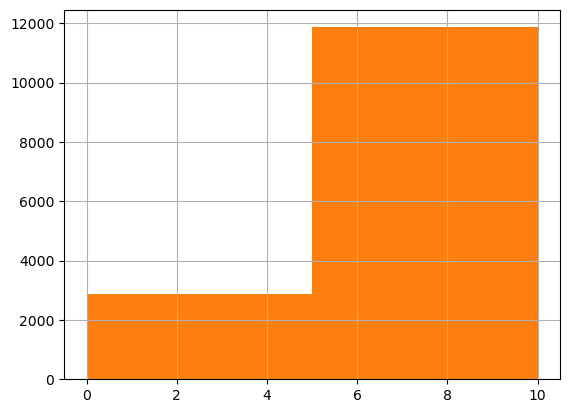

In [189]:
df.rating.hist()
df.rating.hist(bins=2)

In [191]:
df.rating

0         1
1        10
2         8
3         8
4        10
         ..
14720    10
14721     7
14722     8
14723    10
14724    10
Name: rating, Length: 14725, dtype: int64

In [ ]:
# 클래스 임의로 나누기 rating 1-10 --> 5초과 == 1, 5이하 ==0
# df['label'] = pd.qcut(df.rating, q=2, labels=[0,1])
df['label'] = (df.rating > 5).astype(int) 
df.tail(2)

,review,rating,date,title,label
14723,간만에 제대로 잘짜여진 각본의 영화를 봤네 여운이 아직도 남아~어른을 위한 애니~,10,2018.01.12,코코,1
14724,한국개봉을 눈빠지게 기다린 보람이있다 깨우치는게 많은 영화,10,2018.01.12,코코,1


In [ ]:
# 벡터화 n-gram별 벡터화 및 특성 비교
from sklearn.feature_extraction.text import TfidfVectorizer, TfidfTransformer

def tokenizer_morphs (text):
    '''형태소 기반 토크나이저'''  #함수 마우스 올리면 팝업설명 뜨게하는 기능
    return okt.morphs(text)

# 1-gram
vec_1gram = TfidfVectorizer(tokenizer=tokenizer_morphs, ngram_range=(1,1), max_features=50)
X_1gram = vec_1gram.fit_transform(df.review)
print (f'차원 : {X_1gram.shape}')
features_1gram = vec_1gram.get_feature_names_out()[:20]
print (f"{', '.join(features_1gram)}")

차원 : (14725, 50)
!, ,, ., .., ..., ?, cg, ~, 가, 감동, 것, 고, 과, 그, 너무, 눈물, 는, 다, 더, 도


In [220]:
# 2-gram
# vec_2gram = TfidfVectorizer(tokenizer=tokenizer_morphs, ngram_range=(2,2), max_features=1000)
vec_2gram = TfidfVectorizer(tokenizer=custom_tokenizer, ngram_range=(2,2), max_features=1000)

X_2gram = vec_2gram.fit_transform(df.review)
print (f'차원 : {X_2gram.shape}')
features_2gram = vec_2gram.get_feature_names_out()

# 추출된 특성 중에서 2글자이상인것만 출력
bigram = [f for f in features_2gram if len(f.split()) > 1][:15]
print(f"{', '.join(bigram)}")

차원 : (14725, 1000)
가는 줄, 가는줄 모르게, 가는줄 모르고, 가면 갈수록, 가슴 먹, 가슴 아픈, 가족 끼리, 가족 대한, 가족 보기, 가족 사랑, 가족 소중함을, 가족 애, 감 정선, 감독 연출, 감독 영화


In [232]:
# 3-gram
vec_3gram = TfidfVectorizer(tokenizer=custom_tokenizer, ngram_range=(3,3), max_features=1000)
X_3gram = vec_3gram.fit_transform(df.review)
print (f'차원 : {X_3gram.shape}')
features_3gram = vec_3gram.get_feature_names_out()


# 추출된 특성 중에서 3글자이상인것만 출력
trigram = [f for f in features_3gram if len(f.split())>2][:15]
print (f"{', '.join(trigram)}")

차원 : (14725, 1000)
가는 줄 모르고, 가는 줄 몰랐다, 가는줄 모르고 본, 가는줄 모르고 봄, 가는줄 모르고 봤네요, 가는줄 모르고 봤습니다, 가는줄 모르고 봤어요, 가는줄 모르고 봤음, 가는줄 모르고 재밌게, 가디언즈 오브 갤럭시, 가슴 따뜻한 영화, 가슴 따뜻해지는 영화, 가슴 뜨거워지는 영화, 가슴 먹 먹, 가슴 먹 먹하게


In [215]:
# 1-gram 모델 학습 예측 결과
# 데이터 분할
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression 

X_train, X_test, y_train, y_test = train_test_split(df.review, df.label, test_size=0.2, stratify=df.label, random_state=42)

# 1gram 모델
vec_1 = TfidfVectorizer(tokenizer=custom_tokenizer, ngram_range=(1,1), max_features=1000)
X_train_1 = vec_1.fit_transform(X_train)
X_test_1 = vec_1.transform(X_test)

clf_1 = LogisticRegression()
clf_1.fit(X_train_1, y_train)
print (clf_1.score (X_test_1, y_test))


from sklearn.metrics import classification_report
predict_1 = clf_1.predict(X_test_1)
print (classification_report(y_test, predict_1))

0.8366723259762309
              precision    recall  f1-score   support

           0       0.77      0.46      0.57       709
           1       0.85      0.96      0.90      2236

    accuracy                           0.84      2945
   macro avg       0.81      0.71      0.74      2945
weighted avg       0.83      0.84      0.82      2945



In [233]:
# 2-gram 모델 학습 예측 결과 ngram_range=(2,2)

vec_2 = TfidfVectorizer(tokenizer=custom_tokenizer, ngram_range=(2,2), max_features=1000)
X_train_2 = vec_2.fit_transform(X_train)
X_test_2 = vec_2.transform(X_test)

clf_2 = LogisticRegression()
clf_2.fit(X_train_2, y_train)
print (clf_2.score (X_test_2, y_test))


from sklearn.metrics import classification_report
predict_2 = clf_2.predict(X_test_2)
print (classification_report(y_test, predict_2))

0.7918505942275043
              precision    recall  f1-score   support

           0       0.77      0.19      0.31       709
           1       0.79      0.98      0.88      2236

    accuracy                           0.79      2945
   macro avg       0.78      0.59      0.59      2945
weighted avg       0.79      0.79      0.74      2945



In [234]:
# 3-gram 모델 학습 예측 결과 ngram_range=(3,3)

vec_3 = TfidfVectorizer(tokenizer=custom_tokenizer, ngram_range=(3,3), max_features=1000)
X_train_3 = vec_3.fit_transform(X_train)
X_test_3 = vec_3.transform(X_test)

clf_3 = LogisticRegression()
clf_3.fit(X_train_3, y_train)
print (clf_3.score (X_test_3, y_test))

from sklearn.metrics import classification_report
predict_3 = clf_3.predict(X_test_3)
print (classification_report(y_test, predict_3))

0.767402376910017
              precision    recall  f1-score   support

           0       0.93      0.04      0.07       709
           1       0.77      1.00      0.87      2236

    accuracy                           0.77      2945
   macro avg       0.85      0.52      0.47      2945
weighted avg       0.81      0.77      0.68      2945



In [ ]:
##########gpt 추천 코드

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report

# 1️⃣ 데이터 분할 (한 번만 수행)
X_train, X_test, y_train, y_test = train_test_split(
    df.review, df.label,
    test_size=0.2,
    stratify=df.label,
    random_state=42
)

# 2️⃣ 커스텀 토크나이저 (형태소 기준) ['Noun','Verb','Adjective'] : 명사/동사/형용사만 선택
def custom_tokenizer(text):
    morphs = [word for word, tag in okt.pos(text) if tag in ['Noun', 'Verb', 'Adjective']]
    return morphs

# 3️⃣ TF-IDF 벡터화 (3-gram)
vec_3 = TfidfVectorizer(
    tokenizer=custom_tokenizer,
    ngram_range=(3, 3),   # ngram_range=(1, 3)1-3-gram까지 포함
    max_features=None     # 최대 단어 수 제한 없음
)
# (추가로 알아두면 좋은 파라미터)
# analyzer='word' : 단어 단위 분석 (기본값)
# min_df=1 : 최소 문서 등장 수 필터
# max_df=0.9 : 전체 문서의 90% 이상 등장하는 단어 제외



# 벡터화
X_train_3 = vec_3.fit_transform(X_train)
X_test_3 = vec_3.transform(X_test)

print("특징 수:", len(vec_3.get_feature_names_out()))
print("훈련 데이터 벡터 크기:", X_train_3.shape)

# 4️⃣ 모델 학습
clf_3 = LogisticRegression(max_iter=1000, solver='liblinear')
# max_iter=1000 : 반복 최대값, 벡터가 희소(sparse)하면 기본 100으로는 수렴 안 될 수 있음
# solver='liblinear' : 작은/희소 데이터에서 안정적인 학습
# 'lbfgs', 'saga' 등 다른 solver 가능
# 기본값만 쓰면 경고 발생 가능 → max_iter 늘려주는 것이 안전


clf_3.fit(X_train_3, y_train)

# 5️⃣ 평가
score_3 = clf_3.score(X_test_3, y_test)
print("\n=== 3-gram 모델 성능 ===")
print("정확도:", round(score_3, 4))

predict_3 = clf_3.predict(X_test_3)
print(classification_report(y_test, predict_3))



특징 수: 128533
훈련 데이터 벡터 크기: (11780, 128533)

=== 3-gram 모델 성능 ===
정확도: 0.7613
              precision    recall  f1-score   support

           0       1.00      0.01      0.02       709
           1       0.76      1.00      0.86      2236

    accuracy                           0.76      2945
   macro avg       0.88      0.50      0.44      2945
weighted avg       0.82      0.76      0.66      2945

